In [1]:
from google.colab import drive
#@title 1.0 Connect using google drive so your images remained saved outside of the virtual environment
#@markdown If you connect your Google Drive, you can save the final image of each run on your drive.

google_drive = True #@param {type:"boolean"}

if google_drive is True:
  root =
  drive.mount('/content/drive')
  root_path = '/content/drive/MyDrive/AI'

else:
  root_path = '/content'

drive.mount("/content/drive", force_remount=True)

Mounted at /content/drive
Mounted at /content/drive


# Install

In [4]:
import os
# Path of the directory to be created
root_path = '/content/drive/MyDrive/AI'

# Create the directory, only if it does not exist
os.makedirs(root_path, exist_ok=True)

# Check if the directory was created or exists
if os.path.exists(root_path):
    print("Folder is created or already exists.")
else:
    print("Failed to create the folder.")

Folder is created or already exists.


In [6]:
# Repository URL and the name of the repository
repo_url = 'https://github.com/diffusiongit/text2room_DE.git'
repo_name = 'text2room_DE'  # Extracted from the repo URL

# Full path for the new subdirectory
full_repopath = os.path.join(root_path, repo_name)

# Create the subdirectory if it doesn't exist
os.makedirs(full_repopath, exist_ok=True)

# Clone the repository into the specified directory
!git clone {repo_url} {full_repopath}

Cloning into '/content/drive/MyDrive/AI/text2room_DE'...
remote: Enumerating objects: 63, done.
remote: Counting objects: 100% (63/63), done.
remote: Compressing objects: 100% (42/42), done.
remote: Total 63 (delta 17), reused 59 (delta 16), pack-reused 0
Receiving objects: 100% (63/63), 1.96 MiB | 6.48 MiB/s, done.
Resolving deltas: 100% (17/17), done.


In [20]:
%cd /content/drive/MyDrive/AI/text2room_DE

/content/drive/MyDrive/AI/text2room_DE


In [11]:
import gdown


os.makedirs('checkpoints', exist_ok=True)


# Google Drive File ID
normal_id = '1joC2lim4Zf9BywAfwQAdB9Funec4EAtm'
iron_id ='1janrxs5bcu1Djx_clBBvb9r_kv7jN1EJ'

# Output filename (Optional: can be changed to your preferred file name)
scannet_filename = 'normal_scannet.pt'
irondepth_filename = 'irondepth_scannet.pt'

# Download the file
gdown.download(f'https://drive.google.com/uc?id={normal_id}', os.path.join('checkpoints',scannet_filename), quiet=False)
# Download the file
gdown.download(f'https://drive.google.com/uc?id={iron_id}', os.path.join('checkpoints',irondepth_filename), quiet=False)

Downloading...
From: https://drive.google.com/uc?id=1joC2lim4Zf9BywAfwQAdB9Funec4EAtm
To: /content/drive/MyDrive/AI/text2room_DE/checkpoints/normal_scannet.pt
100%|██████████| 291M/291M [00:09<00:00, 31.8MB/s]
Downloading...
From: https://drive.google.com/uc?id=1janrxs5bcu1Djx_clBBvb9r_kv7jN1EJ
To: /content/drive/MyDrive/AI/text2room_DE/checkpoints/irondepth_scannet.pt
100%|██████████| 291M/291M [00:02<00:00, 113MB/s]


'checkpoints/irondepth_scannet.pt'

In [12]:
import torch
print(torch.__version__)

2.1.0+cu121


In [31]:
!pip install -r requirements.txt

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 212.8/212.8 kB 3.6 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 60.0/60.0 kB 7.2 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 199.3/199.3 kB 7.8 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 96.6/96.6 kB 8.3 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 300.3/300.3 kB 8.1 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 10.2/10.2 MB 6.6 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 737.4/737.4 kB 35.6 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 101.8/101.8 kB 14.0 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.0/1.0 MB 29.9 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 199.8/199.8 kB 22.2 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 61.5/61.5 kB 6.5 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 3.4/3.4 MB 9.8 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━

In [15]:
!pip install fastapi kaleido python-multipart uvicorn cohere openai tiktoken


     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 92.0/92.0 kB 1.7 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 79.9/79.9 MB 7.5 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 45.7/45.7 kB 5.6 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 60.3/60.3 kB 7.4 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 51.7/51.7 kB 6.7 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 224.7/224.7 kB 25.1 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 2.0/2.0 MB 39.7 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 70.0/70.0 kB 9.2 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 58.3/58.3 kB 7.7 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 3.1/3.1 MB 61.5 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 75.9/75.9 kB 8.4 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 76.9/76.9 kB 9.1 MB/s eta 0:00:00
  Attempting uninstall: typing-extensio

In [16]:
import os
import sys
import torch
need_pytorch3d=False
try:
    import pytorch3d
except ModuleNotFoundError:
    need_pytorch3d=True
if need_pytorch3d:
    if torch.__version__.startswith("2.1.") and sys.platform.startswith("linux"):
        f"We try to install PyTorch3D via a released wheel."
        pyt_version_str=torch.__version__.split("+")[0].replace(".", "")
        version_str="".join([
            f"py3{sys.version_info.minor}_cu",
            torch.version.cuda.replace(".",""),
            f"_pyt{pyt_version_str}"
        ])
        print(f' https://dl.fbaipublicfiles.com/pytorch3d/packaging/wheels/{version_str}/download.html')
        !pip install fvcore iopath
        !pip install --no-index --no-cache-dir pytorch3d -f https://dl.fbaipublicfiles.com/pytorch3d/packaging/wheels/{version_str}/download.html
    else:
        # We try to install PyTorch3D from source.
        !pip install 'git+https://github.com/facebookresearch/pytorch3d.git@stable'

 https://dl.fbaipublicfiles.com/pytorch3d/packaging/wheels/py310_cu121_pyt210/download.html
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 50.2/50.2 kB 1.0 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 42.2/42.2 kB 2.3 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
  Created wheel for fvcore: filename=fvcore-0.1.5.post20221221-py3-none-any.whl size=61400 sha256=cb54b34df73af700d1616603bac294853ffc666fc4c34ac71e730072c06ee389
  Stored in directory: /root/.cache/pip/wheels/01/c0/af/77c1cf53a1be9e42a52b48e5af2169d40ec2e89f7362489dd0
  Created wheel for iopath: filename=iopath-0.1.10-py3-none-any.whl size=31532 sha256=94688229fc66b19353d8df1311bd8236a0f47a388d682ce7561483d4b515be75
  Stored in directory: /root/.cache/pip/wheels/9a/a3/b6/ac0fcd1b4ed5cfeb3db92e6a0e476cfd48ed0df92b91080c1d
Successfully built fvcore iopath
Looking in links: https://dl.fbaipublicfiles.com/pytorch3d/packaging/wheels/py310_cu121_pyt210/download.h

In [17]:
import pytorch3d
print(pytorch3d.__version__)

0.7.5


# Upload Image to start

Saving Spa.png to Spa.png


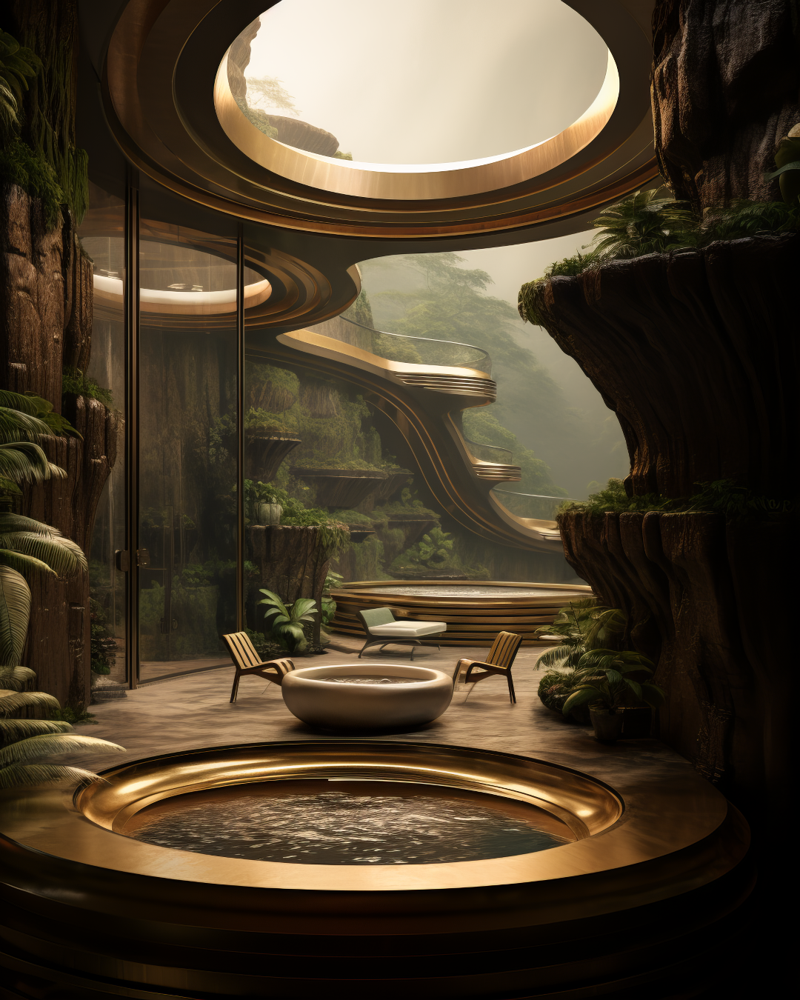

In [33]:
#@markdown #**Upload Image by Running this cell** 🎭

from google.colab import files
import os
from PIL import Image

# Folder where you want to store the uploaded image
target_folder = os.path.join(full_repopath,'Images')

# Create the folder if it doesn't exist
os.makedirs(target_folder, exist_ok=True)

# Use the Colab file upload widget
uploaded_files = files.upload()

for filename in uploaded_files.keys():
    # Construct the full path for the target folder
    destination_path = os.path.join(target_folder, filename)

    # Move the file
    os.rename(filename, destination_path)

image_path = destination_path
image = Image.open(image_path)
image


# Generate 3D

---

As default, we generate a living room scene:

python generate_scene.py

Outputs are stored in text2room/output.

Generated outputs
We generate the following outputs per generated scene:

1.   Mesh Files:
    <output_root>/fused_mesh/after_generation.ply: generated mesh after the first stage of our method
    <output_root>/fused_mesh/fused_final.ply: generated mesh after the second stage of our method
    <output_root>/fused_mesh/x_poisson_meshlab_depth_y.ply: result of applying poisson surface reconstruction on mesh x with depth y
    <output_root>/fused_mesh/x_poisson_meshlab_depth_y_quadric_z.ply: result of applying poisson surface reconstruction on mesh x with depth y and then decimating the mesh to have at least z faces
2.   Renderings:
    <output_root>/output_rendering/rendering_t.png: image from pose t, that was rendered from the final mesh
    <output_root>/output_rendering/rendering_noise_t.png: image from a slightly different/noised pose t, that was rendered from the final mesh
    <output_root>/output_depth/depth_t.png: depth from pose t, that was rendered from the final mesh
    <output_root>/output_depth/depth_noise_t.png: depth from a slightly different/noised pose t, that was rendered from the final mesh
3.   Metadata:
    <output_root>/settings.json: all arguments used to generate the scene
    <output_root>/seen_poses.json: list of all poses in Pytorch3D convention used to render output_rendering (no noise)
    <output_root>/seen_poses_noise.json: list of all poses in Pytorch3D convention used to render output_rendering (with noise)
    <output_root>/transforms.json: a file in the standard NeRF convention (e.g. see NeRFStudio) that can be used to optimize a NeRF for the generated scene. It refers to the rendered images in output_rendering (no noise)



# Create a scene from a starting image

In [35]:
prompt = "modern kitchen in japandi style" #@param {type:"string"}
trajectory_file= 'model/trajectories/examples/mix_kitchen_living_room.json'#@param {type:"string"}



!python generate_scene.py --input_image_path {image_path} --models_path /content/drive/MyDrive/AI/text2room_DE/checkpoints --trajectory_file {trajectory_file} --prompt {prompt}

2024-01-10 05:11:54.068081: E external/local_xla/xla/stream_executor/cuda/cuda_dnn.cc:9261] Unable to register cuDNN factory: Attempting to register factory for plugin cuDNN when one has already been registered
2024-01-10 05:11:54.068152: E external/local_xla/xla/stream_executor/cuda/cuda_fft.cc:607] Unable to register cuFFT factory: Attempting to register factory for plugin cuFFT when one has already been registered
2024-01-10 05:11:54.070216: E external/local_xla/xla/stream_executor/cuda/cuda_blas.cc:1515] Unable to register cuBLAS factory: Attempting to register factory for plugin cuBLAS when one has already been registered
2024-01-10 05:11:55.793771: W tensorflow/compiler/tf2tensorrt/utils/py_utils.cc:38] TF-TRT Warning: Could not find TensorRT
trajectories len: 20
Fetching 13 files:   0% 0/13 [00:00<?, ?it/s]













Fetching 13 files:   8% 1/13 [00:02<00:24,  2.02s/it]













































































































# Create a scene from another room type
Generate indoor-scenes of arbitrary rooms by specifying another --trajectory_file as input:

In [36]:
prompt = "modern kitchen in japandi style" #@param {type:"string"}
trajectory_file= 'model/trajectories/examples/mix_kitchen_living_room.json'#@param {type:"string"}

!python generate_scene.py --trajectory_file {trajectory_file} --prompt {prompt}

2024-01-10 05:26:59.340975: E external/local_xla/xla/stream_executor/cuda/cuda_dnn.cc:9261] Unable to register cuDNN factory: Attempting to register factory for plugin cuDNN when one has already been registered
2024-01-10 05:26:59.341036: E external/local_xla/xla/stream_executor/cuda/cuda_fft.cc:607] Unable to register cuFFT factory: Attempting to register factory for plugin cuFFT when one has already been registered
2024-01-10 05:26:59.342530: E external/local_xla/xla/stream_executor/cuda/cuda_blas.cc:1515] Unable to register cuBLAS factory: Attempting to register factory for plugin cuBLAS when one has already been registered
2024-01-10 05:27:01.397350: W tensorflow/compiler/tf2tensorrt/utils/py_utils.cc:38] TF-TRT Warning: Could not find TensorRT
trajectories len: 20
Fetching 13 files:   0% 0/13 [00:00<?, ?it/s]

















Fetching 13 files:   8% 1/13 [00:02<00:25,  2.14s/it]









































































































# Modifying and creating trajectories

In [ ]:
#Trajectory Format
#Each trajectory.json file should satisfy the following format:

[
  {
    "prompt": (str, optional) the prompt to use for this trajectory,
    "negative_prompt": (str, optional) the negative prompt to use for this trajectory,
    "n_images": (int, optional) how many images to render between start and end pose of this trajectory,
    "surface_normal_threshold": (float, optional) the surface_normal_threshold to use for this trajectory
    "fn_name": (str, required) the name of a trajectory_function as specified in model/trajectories/trajectory_util.py
    "fn_args": (dict, optional) {
      "a": value for an argument with name 'a' of fn_name,
      "b": value for an argument with name 'b' of fn_name,
    },
    "adaptive": (list, optional) [
      {
        "arg": (str, required) name of an argument of fn_name that represents a float value,
        "delta": (float, required) delta value to add to the argument during adaptive pose search,
        "min": (float, optional) minimum value during search,
        "max": (float, optional) maximum value during search
      }
    ]
  },

  {... next trajectory with similar structure as above ...}
]

# Visualize Renders

In [38]:
plyfile = '/content/drive/MyDrive/AI/text2room_DE/output/mix_kitchen_living_room/full_trajectory/a_living_room_with_a_lit_furnace,_couch_/no_input_image_file/2024-01-10_05:28:24.843562Z/fused_mesh/fused_until_frame_0100.ply'#@param {type:"string"}
seen_poses = '/content/drive/MyDrive/AI/text2room_DE/output/mix_kitchen_living_room/full_trajectory/a_living_room_with_a_lit_furnace,_couch_/no_input_image_file/2024-01-10_05:28:24.843562Z/seen_poses.json'#@param {type:"string"}


!python render_cameras.py -m {plyfile} -c {seen_poses}

2024-01-10 06:07:09.124859: E external/local_xla/xla/stream_executor/cuda/cuda_dnn.cc:9261] Unable to register cuDNN factory: Attempting to register factory for plugin cuDNN when one has already been registered
2024-01-10 06:07:09.124920: E external/local_xla/xla/stream_executor/cuda/cuda_fft.cc:607] Unable to register cuFFT factory: Attempting to register factory for plugin cuFFT when one has already been registered
2024-01-10 06:07:09.129186: E external/local_xla/xla/stream_executor/cuda/cuda_blas.cc:1515] Unable to register cuBLAS factory: Attempting to register factory for plugin cuBLAS when one has already been registered
2024-01-10 06:07:10.741526: W tensorflow/compiler/tf2tensorrt/utils/py_utils.cc:38] TF-TRT Warning: Could not find TensorRT
WARN: no start image specified, should call load_mesh() before rendering images!
Save Renderings [Noise=False]: 100% 131/131 [01:39<00:00,  1.32it/s]


In [39]:
import imageio
import os

image_folder = '/content/drive/MyDrive/AI/text2room_DE/output/mix_kitchen_living_room/full_trajectory/a_living_room_with_a_lit_furnace,_couch_/no_input_image_file/2024-01-10_05:28:24.843562Z/output_rendering'#@param {type:"string"}
fps = 10 #@param {type:"number"}

def images_to_video(image_folder, output_video_file, fps=12):
    images = sorted([os.path.join(image_folder, image) for image in os.listdir(image_folder) if image.endswith((".png", ".jpg", ".jpeg"))])

    if len(images) == 0:
        print("No images found in the specified directory!")
        return

    with imageio.get_writer(output_video_file, format='FFMPEG', fps=fps) as writer:
        for index, image in enumerate(images):
            img = imageio.imread(image)
            writer.append_data(img)

    print(f"Video saved as {output_video_file}")


fps_value = int(fps)
folder =  image_folder
output_folder = os.path.join(os.path.dirname(folder), "output_videos")
os.makedirs(output_folder, exist_ok=True)

output_file_name = f"{os.path.basename(folder)}_{fps_value}.mp4"
output_file_path = os.path.join(output_folder, output_file_name)

images_to_video(folder, output_file_path, fps_value)

output_folder = os.path.join(os.path.dirname(folder), "output_videos")

print(f"output folder: {output_folder}")


<ipython-input-39-5cfa9e99ccc8>:16: DeprecationWarning: Starting with ImageIO v3 the behavior of this function will switch to that of iio.v3.imread. To keep the current behavior (and make this warning disappear) use `import imageio.v2 as imageio` or call `imageio.v2.imread` directly.
  img = imageio.imread(image)


Video saved as /content/drive/MyDrive/AI/text2room_DE/output/mix_kitchen_living_room/full_trajectory/a_living_room_with_a_lit_furnace,_couch_/no_input_image_file/2024-01-10_05:28:24.843562Z/output_videos/output_rendering_10.mp4
output folder: /content/drive/MyDrive/AI/text2room_DE/output/mix_kitchen_living_room/full_trajectory/a_living_room_with_a_lit_furnace,_couch_/no_input_image_file/2024-01-10_05:28:24.843562Z/output_videos


In [49]:
# @title **See video in the browser**
# @markdown This process may take a little longer. If you don't want to wait, download it by executing the next cell instead of using this cell.
from base64 import b64encode
from IPython import display
filepath = '/content/drive/MyDrive/AI/text2room_DE/output/mix_kitchen_living_room/full_trajectory/a_living_room_with_a_lit_furnace,_couch_/no_input_image_file/2024-01-10_05:28:24.843562Z/output_videos/output_rendering_10.mp4'#@param {type:"string"}
mp4 = open(filepath,'rb').read()
data_url = "data:video/mp4;base64," + b64encode(mp4).decode()
display.HTML("""
<video width=400 controls>
      <source src="%s" type="video/mp4">
</video>
""" % data_url)

In [44]:
import trimesh


ply_path = '/content/drive/MyDrive/AI/text2room_DE/output/mix_kitchen_living_room/full_trajectory/a_living_room_with_a_lit_furnace,_couch_/no_input_image_file/2024-01-10_05:28:24.843562Z/fused_mesh/fused_until_frame_0100.ply'#@param {type:"string"}
# Load the mesh
# Replace 'path_to_your_mesh_file.ply' with the path to your PLY file
mesh = trimesh.load(ply_path)


In [47]:
faces = np.array(mesh.faces)
faces.shape

(6485084, 3)

# Plot Cameras

Camera introduction
https://skannai.medium.com/projecting-3d-points-into-a-2d-screen-58db65609f24

In [90]:
#@markdown #**Interactive Camera Plot ** 🎭

#@markdown **View seen cameras**

import os
import json
import torch
import numpy as np
import plotly.graph_objects as go
from pytorch3d.transforms import euler_angles_to_matrix, matrix_to_euler_angles


seen_poses = '/content/drive/MyDrive/AI/text2room_DE/output/mix_kitchen_living_room/full_trajectory/a_living_room_with_a_lit_furnace,_couch_/no_input_image_file/2024-01-10_05:28:24.843562Z/seen_poses.json'#@param {type:"string"}

def convert_pose_to_nerf_convention(world_to_cam: torch.Tensor) -> torch.Tensor:
    """
    Converts a world_to_cam matrix in pytorch3d convention to a cam_to_world matrix in the original nerf convention (e.g. as in nerf_synthetic dataset).

    We need camera orientation as in OpenGL/Blender which is:
    +X is right, +Y is up, and +Z is pointing back and away from the camera. -Z is the look-at direction.
    World Space also has a specific convetion which is:
    Our world space is oriented such that the up vector is +Z. The XY plane is parallel to the ground plane.
    See here for details: https://docs.nerf.studio/en/latest/quickstart/data_conventions.html

    We use pytorch3d convention which is:
    +X is left, +Y is up, and +Z is pointing front. +Z is the look-at direction.
    See here for details: https://pytorch3d.org/docs/cameras

    :param world_to_cam: [4,4] torch.Tensor
    :return: cam_to_world: [4,4] torch.Tensor
    """
    world_to_cam = world_to_cam.clone()

    # change rotation, XZ rotation must be flipped
    angles = matrix_to_euler_angles(world_to_cam[:3, :3], "XYZ")
    angles[0] = -angles[0]
    angles[2] = -angles[2]
    world_to_cam[:3, :3] = euler_angles_to_matrix(angles, "XYZ")

    # change translation, XZ translation must be flipped
    world_to_cam[0, 3] = -world_to_cam[0, 3]
    world_to_cam[2, 3] = -world_to_cam[2, 3]

    # have world_to_cam, need cam_to_world
    cam_to_world = world_to_cam.inverse()

    # xyz --> zxy. Want to have XY plane parallel to ground plane
    xyz_to_zxy = torch.tensor([
        [0, 0, 1, 0],
        [1, 0, 0, 0],
        [0, 1, 0, 0],
        [0, 0, 0, 1]
    ]).to(cam_to_world)

    return xyz_to_zxy @ cam_to_world

poses = torch.empty((0, 4, 4))

with open(seen_poses) as json_file:
    contents = json.load(json_file)
    keys = contents.keys()
    #print(keys)
    for k in keys:
      #print(k)
      cam = contents[k]
      #print(cam)

      c2w = torch.tensor(cam)
      c2w[:3, 1:3] *= -1  # Convert to the desired coordinate system
      #c2w_nerf = convert_pose_to_nerf_convention(c2w)
      poses = torch.cat((poses, c2w.unsqueeze(0)), dim=0)

import numpy as np

def get_camera_mesh(pose, depth=1):
    # Create vertices for the camera frustum/pyramid
    # A simple representation with the camera at the origin and the frustum in the negative z-direction
    vertices = np.array([
        [-0.5, -0.5, -1],  # Bottom-left
        [0.5, -0.5, -1],   # Bottom-right
        [0.5, 0.5, -1],    # Top-right
        [-0.5, 0.5, -1],   # Top-left
        [0, 0, 0]          # Camera origin
    ]) * depth

    # Apply the pose transformation
    vertices_homogeneous = np.hstack([vertices, np.ones((vertices.shape[0], 1))])  # Convert to homogeneous coordinates
    vertices_transformed = (pose @ vertices_homogeneous.T).T  # Apply transformation
    vertices_transformed = vertices_transformed[:, :3]  # Back to Cartesian coordinates

    return vertices_transformed

def merge_wireframes(vertices_list):
    # Merge the wireframes of multiple camera meshes for Plotly plotting
    wireframe_merged = {'x': [], 'y': [], 'z': []}

    for vertices in vertices_list:
        # Define lines for the wireframe of each frustum
        lines = [
            [vertices[4], vertices[i]] for i in range(4)
        ] + [[vertices[i], vertices[(i+1) % 4]] for i in range(4)]

        for line in lines:
            for point in line:
                wireframe_merged['x'].append(point[0])
                wireframe_merged['y'].append(point[1])
                wireframe_merged['z'].append(point[2])
            wireframe_merged['x'].append(None)  # Plotly uses None to break the line
            wireframe_merged['y'].append(None)
            wireframe_merged['z'].append(None)

    return wireframe_merged

def draw_poses(poses):
    fig = go.Figure()

    centered_poses = poses.clone()
    centered_poses[:, :, 3] -= torch.mean(centered_poses[:, :, 3], dim=0, keepdim=True)
    # Number of poses
    n = len(poses)

    # Define start and end colors for the gradient (as RGB tuples)
    start_color = np.array([1, 0, 0])  # Red
    end_color = np.array([0, 0, 1])    # Blue
    # Generate a gradient of colors
    colors = np.linspace(start_color, end_color, n)

    # Create and plot camera meshes
    for i, pose in enumerate(centered_poses):
        camera_mesh = get_camera_mesh(pose.numpy(), depth=.1)
        wireframe = merge_wireframes([camera_mesh])

        # Convert color to a Plotly-readable format
        color_str = 'rgb({}, {}, {})'.format(int(colors[i, 0] * 255),
                                             int(colors[i, 1] * 255),
                                             int(colors[i, 2] * 255))

        fig.add_trace(go.Scatter3d(
            x=wireframe['x'],
            y=wireframe['y'],
            z=wireframe['z'],
            mode='lines',
            line=dict(color=color_str, width=2),
            showlegend=False  # Hide the legend entry for this trace
        ))

    # Update layout
    fig.update_layout(
        scene=dict(
            xaxis=dict(visible=True, backgroundcolor="black"),
            yaxis=dict(visible=True, backgroundcolor="black"),
            zaxis=dict(visible=True, backgroundcolor="black"),
            bgcolor='black'
        ),
        margin=dict(r=0, l=0, b=0, t=0),
        width=900,
        height=900,
        showlegend=False  # Hide the legend
    )

    fig.show()

# Call the function with the poses
draw_poses(poses)



In [91]:
#@markdown #**Camera Animated Plot ** 🎭

#@markdown **Plot seen poses during training**



def get_camera_mesh(pose, depth=1):
    vertices = (
        torch.tensor(
            [[-0.5, -0.5, -1], [0.5, -0.5, -1], [0.5, 0.5, -1], [-0.5, 0.5, -1], [0, 0, 0]]
        )
        * depth
    )
    faces = torch.tensor(
        [[0, 1, 2], [0, 2, 3], [0, 1, 4], [1, 2, 4], [2, 3, 4], [3, 0, 4]]
    )
    vertices = vertices @ pose[:, :3, :3].transpose(-1, -2)
    vertices += pose[:, None, :3, 3]
    vertices[..., 1:] *= -1 # Axis flip #why should it be flipped
    wireframe = vertices[:, [0, 1, 2, 3, 0, 4, 1, 2, 4, 3]]
    return vertices, faces, wireframe

def merge_wireframes(wireframe):
    wireframe_merged = [[], [], []]
    for w in wireframe:
        wireframe_merged[0] += [float(n) for n in w[:, 0]]
        wireframe_merged[1] += [float(n) for n in w[:, 1]]
        wireframe_merged[2] += [float(n) for n in w[:, 2]]
    return wireframe_merged


def draw_poses(poses, colours=None, pcd=None, col=None, camdepth = 1, elev=0,azim=90):
    fig = plt.figure(figsize=(20,20))
    fig.patch.set_facecolor('black')  # Set the background color of the figure
    ax = fig.add_subplot(projection='3d', facecolor='black')  # Set the background color of the axes

    # Set the color of the grid lines (if the grid is enabled)
    ax.grid(False)  # Optional: disable the grid
    ax.xaxis.pane.set_edgecolor('black')
    ax.yaxis.pane.set_edgecolor('black')
    ax.zaxis.pane.set_edgecolor('black')

    # Set the color of the labels and ticks
    ax.xaxis.label.set_color('white')
    ax.yaxis.label.set_color('white')
    ax.zaxis.label.set_color('white')
    ax.tick_params(axis='x', colors='white')
    ax.tick_params(axis='y', colors='white')
    ax.tick_params(axis='z', colors='white')

    ax.xaxis.pane.fill = False
    ax.yaxis.pane.fill = False
    ax.zaxis.pane.fill = False


    centered_poses = poses.clone()
    centered_poses[:, :, 3] -= torch.mean(centered_poses[:, :, 3], dim=0, keepdim=True)
    n = len(poses)

    # Define start and end colors for the gradient (as RGB tuples)
    start_color = np.array([1, 0, 0])  # Red
    end_color = np.array([0, 0, 1])    # Blue
    # Generate a gradient of colors
    colours = np.linspace(start_color, end_color, n)

    vertices, faces, wireframe = get_camera_mesh(
        centered_poses, camdepth
    )
    center = vertices[:, -1]
    ps = max(torch.max(center).item(), 0.1)
    ms = min(torch.min(center).item(), -0.1)
    ax.set_xlim3d(ms, ps)
    ax.set_ylim3d(ms, ps)
    ax.set_zlim3d(ms, ps)
    wireframe_merged = merge_wireframes(wireframe)
    for c in range(center.shape[0]):
        ax.plot(
            wireframe_merged[0][c * 10 : (c + 1) * 10],
            wireframe_merged[1][c * 10 : (c + 1) * 10],
            wireframe_merged[2][c * 10 : (c + 1) * 10],
            color=colours[c],
        )


    #print(center.shape)

    # Plot mesh vertices
    if pcd != None:
        ax.scatter(pcd[:, 0], pcd[:, 1], pcd[:, 2], c=col, alpha=.9, label='Mesh Vertices')

    #ax.scatter(0, 0, 0, c="red", alpha=.5, label='Mesh Vertices')

    #print(center[:, 0].shape)

    # Connect the centers of the cameras
    ax.plot(center[:, 0].numpy(), center[:, 1].numpy(), center[:, 2].numpy(), color='white', alpha = 0.2,linestyle='--',marker='o')

    # Plot voxel positions
    #ax.scatter(grid_xyz[:, 0], grid_xyz[:, 1], grid_xyz[:, 2], color='green', alpha=.4, label='Voxel Positions')
    # Add labels to the axes
    ax.set_xlabel('X Axis')
    ax.set_ylabel('Y Axis')
    ax.set_zlabel('Z Axis ')

    ax.view_init(elev=elev, azim=azim)

    plt.tight_layout()
    plt.show()
    #fig.canvas.draw()
    #img = np.fromstring(fig.canvas.tostring_rgb(), dtype=np.uint8, sep="")
    #img = img.reshape(fig.canvas.get_width_height()[::-1] + (3,))
    #plt.show()

def rotate_camera(c2w):
    # Rotation matrix for 90 degrees about the Y-axis
    rotation_matrix = torch.tensor([[0, 0, 1],
                                    [0, 1, 0],
                                    [-1, 0, 0]], dtype=torch.float32)

    # Apply rotation to the upper 3x3 part of c2w
    c2w[:3, :3] = torch.matmul(rotation_matrix, c2w[:3, :3])

    return c2w


import matplotlib.pyplot as plt
import numpy as np
import torch
import os

def draw_poses_and_save_frames(poses, output_dir, camdepth = 1,pcd=None, col=None):
    # Create the output directory if it doesn't exist
    os.makedirs(output_dir, exist_ok=True)

    n = len(poses)
    centered_poses = poses.clone()
    centered_poses[:, :, 3] -= torch.mean(centered_poses[:, :, 3], dim=0, keepdim=True)

    # Generate a gradient of colors
    start_color = np.array([1, 0, 0])  # Red
    end_color = np.array([0, 0, 1])    # Blue
    colours = np.linspace(start_color, end_color, n)

    vertices, faces, wireframe = get_camera_mesh(centered_poses, camdepth)
    wireframe_merged = merge_wireframes(wireframe)
    center = vertices[:, -1]

    # Loop through each camera and save a frame
    for frame_idx in range(n):
        fig = plt.figure(figsize=(20,20))
        fig.patch.set_facecolor('black')  # Set the background color of the figure
        ax = fig.add_subplot(projection='3d', facecolor='black')  # Set the background color of the axes
        # Reduce padding and adjust aspect ratio
        # Adjust layout to minimize padding
        plt.subplots_adjust(left=0, right=1, top=1, bottom=0, wspace=0, hspace=0)  # Adjust these values as needed
        ax.set_box_aspect([1,1,1])  # Set equal aspect ratio

        # ... [Setup code for figure and axes]
        ps = max(torch.max(center).item(), 0.5)
        ms = min(torch.min(center).item(), -0.5)
        ax.set_xlim3d(ms, ps)
        ax.set_ylim3d(ms, ps)
        ax.set_zlim3d(ms, ps)
        # Set the color of the grid lines (if the grid is enabled)
        ax.grid(False)  # Optional: disable the grid
        ax.xaxis.pane.set_edgecolor('black')
        ax.yaxis.pane.set_edgecolor('black')
        ax.zaxis.pane.set_edgecolor('black')

        # Set the color of the labels and ticks
        ax.xaxis.label.set_color('white')
        ax.yaxis.label.set_color('white')
        ax.zaxis.label.set_color('white')
        ax.tick_params(axis='x', colors='white')
        ax.tick_params(axis='y', colors='white')
        ax.tick_params(axis='z', colors='white')

        ax.xaxis.pane.fill = False
        ax.yaxis.pane.fill = False
        ax.zaxis.pane.fill = False

        # Remove the tick labels
        ax.set_xticklabels([])
        ax.set_yticklabels([])
        ax.set_zticklabels([])

        # Plot each camera up to the current one
        for c in range(frame_idx + 1):
            ax.plot(wireframe_merged[0][c * 10 : (c + 1) * 10],
                    wireframe_merged[1][c * 10 : (c + 1) * 10],
                    wireframe_merged[2][c * 10 : (c + 1) * 10],
                    color=colours[c])

        # ... [Rest of the plotting code]

            # Connect the centers of the cameras
            #ax.plot(center[:c, 0].numpy(), center[:c, 1].numpy(), center[:c, 2].numpy(), color='white', alpha = 0.2,linestyle='--',marker='o')

        # Calculate elevation and azimuth for the current frame
        elev = 30 + 10 * np.sin(np.radians(frame_idx * 360 / n))  # Example elevation calculation
        azim = 20 + frame_idx * 360 / n  # Example azimuth calculation, rotates one full circle over n frames
        ax.view_init(elev=elev, azim=azim)
        # Further adjust layout
        fig.tight_layout(pad=0)

        # Save the frame
        frame_filename = os.path.join(output_dir, f"frame_{frame_idx:04d}.png")
        plt.savefig(frame_filename)
        plt.close(fig)  # Close the figure to free memory
output_dir = "/content/drive/MyDrive/AI/text2room_DE/output/mix_kitchen_living_room/full_trajectory/a_living_room_with_a_lit_furnace,_couch_/no_input_image_file/2024-01-10_05:28:24.843562Z/Cameras"

draw_poses_and_save_frames(poses, output_dir, camdepth = .5,pcd=None, col=None)

import imageio
import os

image_folder = output_dir
fps = 10 #@param {type:"number"}

def images_to_video(image_folder, output_video_file, fps=12):
    images = sorted([os.path.join(image_folder, image) for image in os.listdir(image_folder) if image.endswith((".png", ".jpg", ".jpeg"))])

    if len(images) == 0:
        print("No images found in the specified directory!")
        return

    with imageio.get_writer(output_video_file, format='FFMPEG', fps=fps) as writer:
        for index, image in enumerate(images):
            img = imageio.imread(image)
            writer.append_data(img)

    print(f"Video saved as {output_video_file}")


fps_value = int(fps)
folder =  image_folder
output_folder = os.path.join(os.path.dirname(folder), "output_videos")
os.makedirs(output_folder, exist_ok=True)

output_file_name = f"{os.path.basename(folder)}_{fps_value}.mp4"
output_file_path = os.path.join(output_folder, output_file_name)

images_to_video(folder, output_file_path, fps_value)

output_folder = os.path.join(os.path.dirname(folder), "output_videos")

print(f"output folder: {output_folder}")

# @title **See video in the browser**
# @markdown This process may take a little longer.
from base64 import b64encode
from IPython import display
filepath = output_file_path
mp4 = open(filepath,'rb').read()
data_url = "data:video/mp4;base64," + b64encode(mp4).decode()
display.HTML("""
<video width=400 controls>
      <source src="%s" type="video/mp4">
</video>
""" % data_url)


<ipython-input-91-c840c038813a>:204: UserWarning:

Tight layout not applied. The left and right margins cannot be made large enough to accommodate all axes decorations.

<ipython-input-91-c840c038813a>:229: DeprecationWarning:

Starting with ImageIO v3 the behavior of this function will switch to that of iio.v3.imread. To keep the current behavior (and make this warning disappear) use `import imageio.v2 as imageio` or call `imageio.v2.imread` directly.



Video saved as /content/drive/MyDrive/AI/text2room_DE/output/mix_kitchen_living_room/full_trajectory/a_living_room_with_a_lit_furnace,_couch_/no_input_image_file/2024-01-10_05:28:24.843562Z/output_videos/Cameras_10.mp4
output folder: /content/drive/MyDrive/AI/text2room_DE/output/mix_kitchen_living_room/full_trajectory/a_living_room_with_a_lit_furnace,_couch_/no_input_image_file/2024-01-10_05:28:24.843562Z/output_videos
